# **Importing Modules and Libraries**

In [ ]:
# importing required libraries
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

import pickle

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

from sklearn import metrics
from sklearn import preprocessing
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier

# **Importing Datasets**

In [ ]:
import os
from google.colab import drive

drive.mount('/content/drive')
directory_path = '/content/drive/My Drive/cybersummer'
dataframes = []

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
file_path = f"{directory_path}/final_df.csv"
final_df = pd.read_csv(file_path)

final_df.head()

,begin,end,id,sampledSeconds,nVehEntered,nVehLeft,nVehSeen,meanSpeed,meanTimeLoss,meanOccupancy,...,meanHaltingDuration,maxHaltingDuration,haltingDurationSum,meanIntervalHaltingDuration,maxIntervalHaltingDuration,intervalHaltingDurationSum,startedHalts,meanVehicleNumber,maxVehicleNumber,Target
0,0.0,10.0,laneAreaDet_w_l1,0.0,0,0,0,-1.0,-1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,5
1,0.0,10.0,laneAreaDet_w_l2,0.0,0,0,0,-1.0,-1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,5
2,0.0,10.0,laneAreaDet_w_l3,0.0,0,0,0,-1.0,-1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,5
3,0.0,10.0,laneAreaDet_w_l4,0.0,0,0,0,-1.0,-1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,5
4,0.0,10.0,laneAreaDet_w_l5,0.0,0,0,0,-1.0,-1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,5


In [ ]:
print(final_df.shape)

(415872, 27)


In [ ]:
missing_values = final_df.isnull().sum()
print("Missing Values in Each Column:\n", missing_values)
final_df = final_df.dropna()

Missing Values in Each Column:
 begin                          0
end                            0
id                             0
sampledSeconds                 0
nVehEntered                    0
nVehLeft                       0
nVehSeen                       0
meanSpeed                      0
meanTimeLoss                   0
meanOccupancy                  0
maxOccupancy                   0
meanMaxJamLengthInVehicles     0
meanMaxJamLengthInMeters       0
maxJamLengthInVehicles         0
maxJamLengthInMeters           0
jamLengthInVehiclesSum         0
jamLengthInMetersSum           0
meanHaltingDuration            0
maxHaltingDuration             0
haltingDurationSum             0
meanIntervalHaltingDuration    0
maxIntervalHaltingDuration     0
intervalHaltingDurationSum     0
startedHalts                   0
meanVehicleNumber              0
maxVehicleNumber               0
Target                         0
dtype: int64


In [ ]:
X = final_df.drop(columns=['Target'])
y = final_df['Target']

In [ ]:
print(X.dtypes)
# Identify non-numeric columns
non_numeric_columns = X.select_dtypes(include=['object', 'category']).columns
print("Non-numeric columns:", non_numeric_columns)

begin                          float64
end                            float64
id                              object
sampledSeconds                 float64
nVehEntered                      int64
nVehLeft                         int64
nVehSeen                         int64
meanSpeed                      float64
meanTimeLoss                   float64
meanOccupancy                  float64
maxOccupancy                   float64
meanMaxJamLengthInVehicles     float64
meanMaxJamLengthInMeters       float64
maxJamLengthInVehicles           int64
maxJamLengthInMeters           float64
jamLengthInVehiclesSum           int64
jamLengthInMetersSum           float64
meanHaltingDuration            float64
maxHaltingDuration             float64
haltingDurationSum             float64
meanIntervalHaltingDuration    float64
maxIntervalHaltingDuration     float64
intervalHaltingDurationSum     float64
startedHalts                   float64
meanVehicleNumber              float64
maxVehicleNumber         

In [ ]:
X = X.drop(columns=non_numeric_columns)

In [ ]:
X.shape

(415872, 25)

# **Data Visualization**

## **Binary Classification**

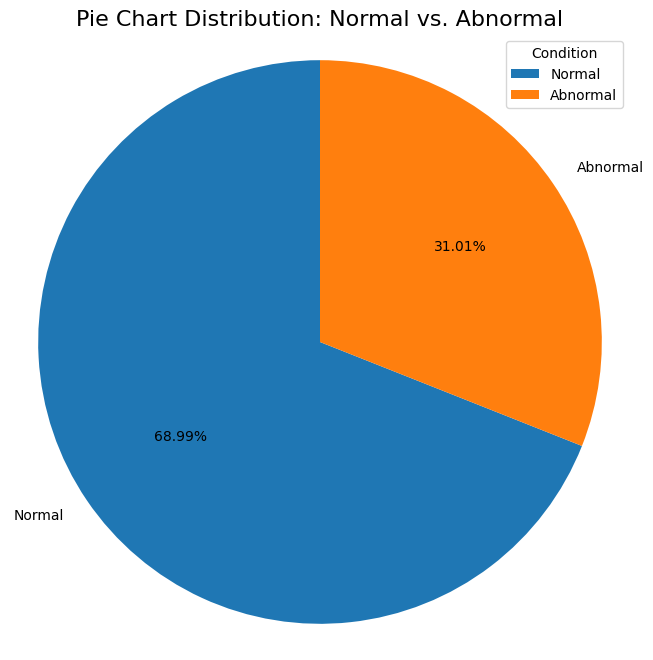

In [ ]:
plt.figure(figsize=(8,8))

# Create a binary classification: 1 for abnormal (0-4), 0 for normal (5)
y_binary = y.apply(lambda x: 'Abnormal' if x < 5 else 'Normal')
binary_counts = y_binary.value_counts()

# normal vs. abnormal
plt.pie(binary_counts, labels=binary_counts.index, autopct='%0.2f%%', startangle=90)
plt.title("Pie Chart Distribution: Normal vs. Abnormal", fontsize=16)
plt.legend(title="Condition", loc="best")
plt.axis('equal')
plt.show()

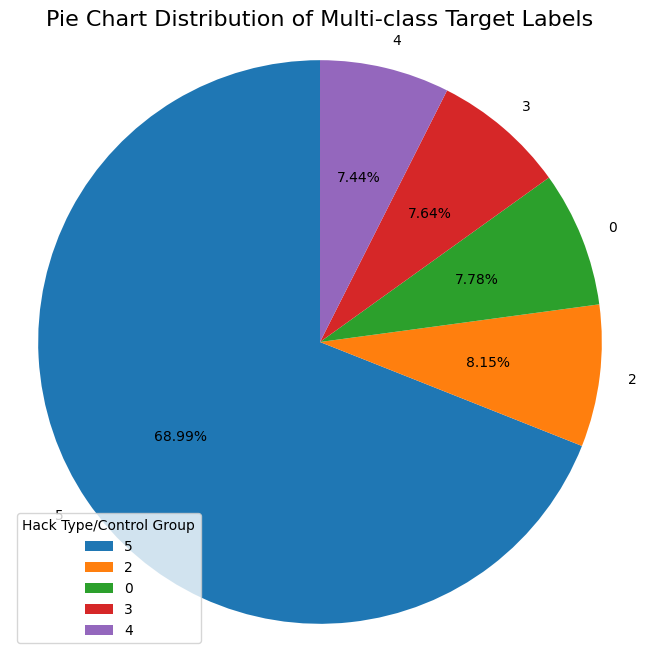

In [ ]:
plt.figure(figsize=(8,8))

target_counts = y.value_counts()

# multi-class
plt.pie(target_counts, labels=target_counts.index, autopct='%0.2f%%', startangle=90)
plt.title("Pie Chart Distribution of Multi-class Target Labels", fontsize=16)
plt.legend(title="Hack Type/Control Group", loc="best")
plt.axis('equal')
plt.show()

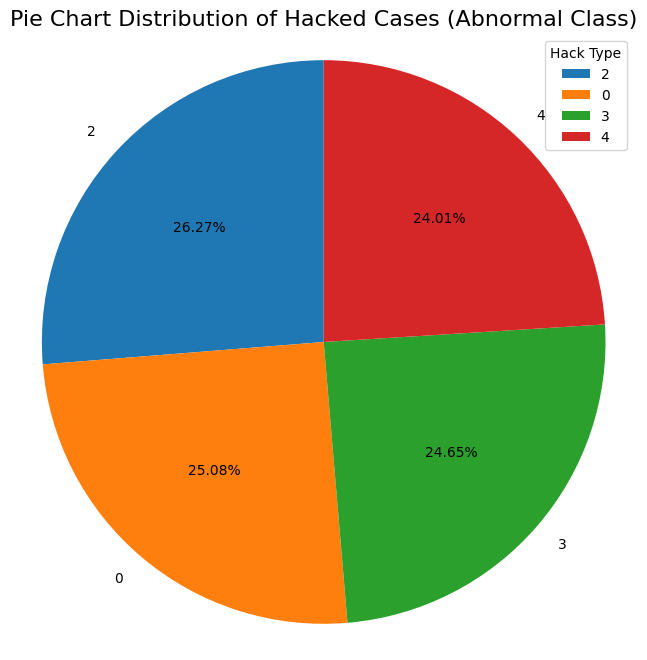

In [ ]:
plt.figure(figsize=(8,8))

abnormal_data = y[y < 5]

abnormal_counts = abnormal_data.value_counts()

# abnormal class
plt.pie(abnormal_counts, labels=abnormal_counts.index, autopct='%0.2f%%', startangle=90)
plt.title("Pie Chart Distribution of Hacked Cases (Abnormal Class)", fontsize=16)
plt.legend(title="Hack Type", loc="best")
plt.axis('equal')
plt.show()

# **Data Normalization**


In [ ]:
# Using MinMaxScaler for normalizing data
minmax_scale = MinMaxScaler(feature_range=(0, 1))

def normalization(df):
    # Applying normalization to all columns in X (no need to exclude 'Target' because it's not in X)
    df_scaled = minmax_scale.fit_transform(df)
    return pd.DataFrame(df_scaled, columns=df.columns)

In [ ]:
# data before normalization
X.head(7)

,begin,end,sampledSeconds,nVehEntered,nVehLeft,nVehSeen,meanSpeed,meanTimeLoss,meanOccupancy,maxOccupancy,...,jamLengthInMetersSum,meanHaltingDuration,maxHaltingDuration,haltingDurationSum,meanIntervalHaltingDuration,maxIntervalHaltingDuration,intervalHaltingDurationSum,startedHalts,meanVehicleNumber,maxVehicleNumber
0,0.0,10.0,0.0,0,0,0,-1.0,-1.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,0.0,10.0,0.0,0,0,0,-1.0,-1.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,0.0,10.0,0.0,0,0,0,-1.0,-1.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,0.0,10.0,0.0,0,0,0,-1.0,-1.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,0.0,10.0,0.0,0,0,0,-1.0,-1.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
5,0.0,10.0,7.0,2,0,2,4.7,2.48,7.1,20.28,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.7,2
6,0.0,10.0,0.0,0,0,0,-1.0,-1.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [ ]:
# Normalizing X (features)
X_normalized = normalization(X.copy())

In [ ]:
# Data after normalization
print(X_normalized.head(7))

   begin  end  sampledSeconds  nVehEntered  nVehLeft  nVehSeen  meanSpeed  \
0    0.0  0.0        0.000000     0.000000       0.0  0.000000   0.000000   
1    0.0  0.0        0.000000     0.000000       0.0  0.000000   0.000000   
2    0.0  0.0        0.000000     0.000000       0.0  0.000000   0.000000   
3    0.0  0.0        0.000000     0.000000       0.0  0.000000   0.000000   
4    0.0  0.0        0.000000     0.000000       0.0  0.000000   0.000000   
5    0.0  0.0        0.029167     0.153846       0.0  0.074074   0.209328   
6    0.0  0.0        0.000000     0.000000       0.0  0.000000   0.000000   

   meanTimeLoss  meanOccupancy  maxOccupancy  ...  jamLengthInMetersSum  \
0      0.000000       0.000000      0.000000  ...                   0.0   
1      0.000000       0.000000      0.000000  ...                   0.0   
2      0.000000       0.000000      0.000000  ...                   0.0   
3      0.000000       0.000000      0.000000  ...                   0.0   
4      0

# **Label Encoding**

## **Binary Labels**

In [ ]:
# Changing Target labels into two categories 'normal' and 'abnormal'
bin_label = pd.DataFrame(y.map(lambda x: 'normal' if x == 5 else 'abnormal'))

In [ ]:
# Creating a DataFrame with binary labels (normal, abnormal)
bin_data = X.copy()  # Copy features
bin_data['Target'] = bin_label

In [ ]:
# Label encoding (0 for 'abnormal', 1 for 'normal') binary labels
le1 = preprocessing.LabelEncoder()
enc_label = bin_label.apply(le1.fit_transform)
bin_data['Target'] = enc_label

In [ ]:
# np.save("le1_classes.npy", le1.classes_, allow_pickle=True)

print(bin_data.head())

   begin   end  sampledSeconds  nVehEntered  nVehLeft  nVehSeen  meanSpeed  \
0    0.0  10.0             0.0            0         0         0       -1.0   
1    0.0  10.0             0.0            0         0         0       -1.0   
2    0.0  10.0             0.0            0         0         0       -1.0   
3    0.0  10.0             0.0            0         0         0       -1.0   
4    0.0  10.0             0.0            0         0         0       -1.0   

   meanTimeLoss  meanOccupancy  maxOccupancy  ...  meanHaltingDuration  \
0          -1.0            0.0           0.0  ...                  0.0   
1          -1.0            0.0           0.0  ...                  0.0   
2          -1.0            0.0           0.0  ...                  0.0   
3          -1.0            0.0           0.0  ...                  0.0   
4          -1.0            0.0           0.0  ...                  0.0   

   maxHaltingDuration  haltingDurationSum  meanIntervalHaltingDuration  \
0           

## **Multi-class Labels**

In [ ]:
multi_label = pd.get_dummies(y, prefix='Target').astype(int)

In [ ]:
multi_data = X.copy()  # Copy features
multi_data = pd.concat([multi_data, multi_label], axis=1)

In [ ]:
print(multi_data.head())

   begin   end  sampledSeconds  nVehEntered  nVehLeft  nVehSeen  meanSpeed  \
0    0.0  10.0             0.0            0         0         0       -1.0   
1    0.0  10.0             0.0            0         0         0       -1.0   
2    0.0  10.0             0.0            0         0         0       -1.0   
3    0.0  10.0             0.0            0         0         0       -1.0   
4    0.0  10.0             0.0            0         0         0       -1.0   

   meanTimeLoss  meanOccupancy  maxOccupancy  ...  maxIntervalHaltingDuration  \
0          -1.0            0.0           0.0  ...                         0.0   
1          -1.0            0.0           0.0  ...                         0.0   
2          -1.0            0.0           0.0  ...                         0.0   
3          -1.0            0.0           0.0  ...                         0.0   
4          -1.0            0.0           0.0  ...                         0.0   

   intervalHaltingDurationSum  startedHalts 

# **Correlation between features of dataset**

In [ ]:
# Define num_col for numeric columns (excluding 'Target')
num_col = list(X.select_dtypes(include='number').columns)

if 'Target' in num_col:
    num_col.remove('Target')

## **Correlation Matrix for Binary Labels**

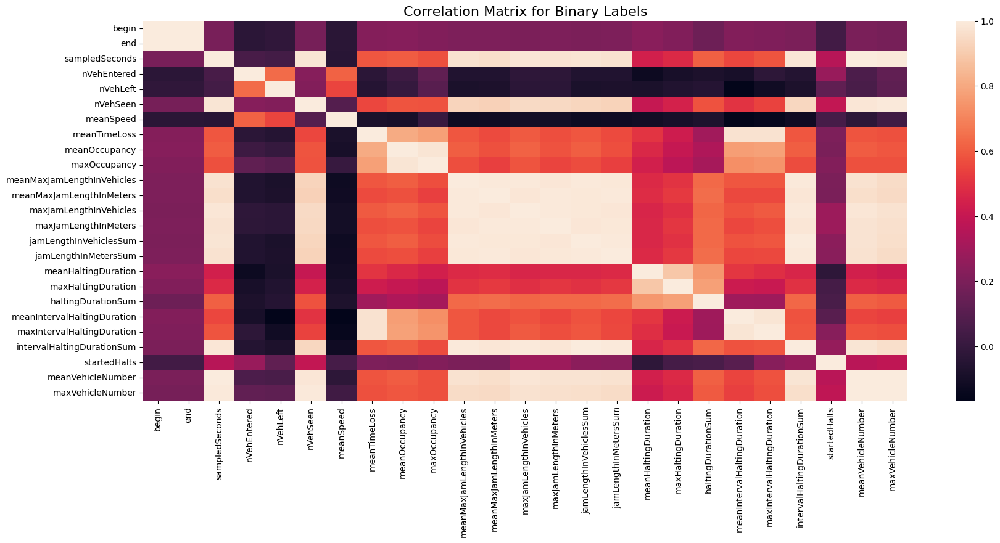

In [ ]:
# Correlation matrix for binary labels
plt.figure(figsize=(20, 8))
corr_bin = bin_data[num_col].corr()
sns.heatmap(corr_bin, vmax=1.0, annot=False)
plt.title('Correlation Matrix for Binary Labels', fontsize=16)
plt.show()

## **Correlation Matrix for Multi-class Labels**

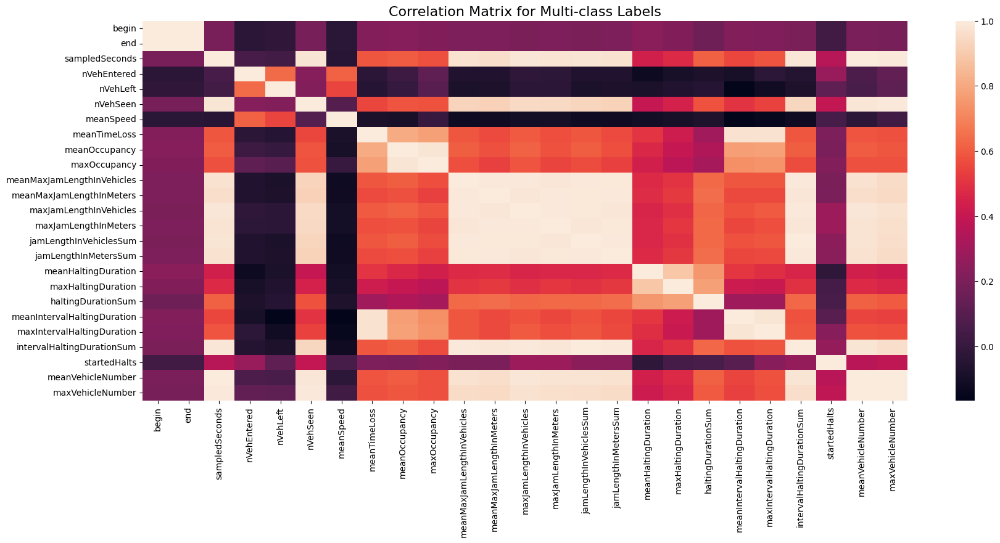

In [ ]:
# Correlation matrix for multi-class labels
plt.figure(figsize=(20, 8))
corr_multi = multi_data[num_col].corr()
sns.heatmap(corr_multi, vmax=1.0, annot=False)
plt.title('Correlation Matrix for Multi-class Labels', fontsize=16)
plt.show()

# **BINARY CLASSIFICATION**

## **Data Splitting**



In [ ]:
X = bin_data.drop(columns=['Target'], axis=1)
Y = bin_data['Target']

In [ ]:
X.head()

,begin,end,sampledSeconds,nVehEntered,nVehLeft,nVehSeen,meanSpeed,meanTimeLoss,meanOccupancy,maxOccupancy,...,jamLengthInMetersSum,meanHaltingDuration,maxHaltingDuration,haltingDurationSum,meanIntervalHaltingDuration,maxIntervalHaltingDuration,intervalHaltingDurationSum,startedHalts,meanVehicleNumber,maxVehicleNumber
0,0.0,10.0,0.0,0,0,0,-1.0,-1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,0.0,10.0,0.0,0,0,0,-1.0,-1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,0.0,10.0,0.0,0,0,0,-1.0,-1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,0.0,10.0,0.0,0,0,0,-1.0,-1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,0.0,10.0,0.0,0,0,0,-1.0,-1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [ ]:
Y.head()

,Target
0,1
1,1
2,1
3,1
4,1


In [ ]:
X_train,X_test,y_train,y_test = train_test_split(X,Y,test_size=0.20, random_state=50)

## **Logistic Regression**

In [ ]:
logr_bin = LogisticRegression(random_state=123, max_iter=5000)

In [ ]:
logr_bin

LogisticRegression(max_iter=5000, random_state=123)

In [ ]:
from datetime import datetime
# Measure training time
start = datetime.now()
logr_bin.fit(X_train, y_train)
end = datetime.now()
lgr_trainTime_bin = end - start
print("Logistic Regression (Binary) Training Time:", lgr_trainTime_bin.total_seconds() * 10**6, "µs")

Logistic Regression (Binary) Training Time: 126233862.0 µs


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
# Measuring inference time
start = datetime.now()
y_pred_bin = logr_bin.predict(X_test)
end = datetime.now()
lgr_inferTime_bin = end - start
print("Logistic Regression (Binary) Inference Time:", lgr_inferTime_bin.total_seconds() * 10**6, "µs")

Logistic Regression (Binary) Inference Time: 9969.0 µs


In [ ]:
print("Mean Absolute Error:", metrics.mean_absolute_error(y_test, y_pred_bin))
print("Mean Squared Error:", metrics.mean_squared_error(y_test, y_pred_bin))
print("Root Mean Squared Error:", np.sqrt(metrics.mean_squared_error(y_test, y_pred_bin)))
print("R² Score:", metrics.explained_variance_score(y_test, y_pred_bin) * 100)
print("Logistic Regression (Binary) Accuracy:", accuracy_score(y_test, y_pred_bin) * 100)

Mean Absolute Error: 0.316946197775774
Mean Squared Error: 0.316946197775774
Root Mean Squared Error: 0.5629797489926027
R² Score: -13.584206294671365
Logistic Regression (Binary) Accuracy: 68.30538022242261


In [ ]:
# Store original accuracy for occlusion sensitivity analysis
original_accuracy_logr = accuracy_score(y_test, y_pred_bin)
print(f"Original Accuracy (Binary): {original_accuracy_logr * 100:.5f}%")

Original Accuracy (Binary): 68.30538%


In [ ]:
# Occlusion Sensitivity Analysis for individual features
accuracy_drop_logr = {}
for feature in X.columns:
    X_test_modified = X_test.copy()
    X_test_modified[feature] = 0  # Mask the feature by setting it to 0
    y_pred_modified = logr_bin.predict(X_test_modified)
    new_accuracy = accuracy_score(y_test, y_pred_modified)
    accuracy_drop_logr[feature] = original_accuracy_logr - new_accuracy

print("\nOcclusion Sensitivity Analysis (Logistic Regression - Binary):")
for feature, drop in sorted(accuracy_drop_logr.items(), key=lambda x: x[1], reverse=True):
    print(f"{feature}: Accuracy Drop = {drop:.4f}")


Occlusion Sensitivity Analysis (Logistic Regression - Binary):
end: Accuracy Drop = 0.3719
meanVehicleNumber: Accuracy Drop = 0.0826
jamLengthInMetersSum: Accuracy Drop = 0.0419
maxIntervalHaltingDuration: Accuracy Drop = 0.0371
maxVehicleNumber: Accuracy Drop = 0.0358
maxJamLengthInVehicles: Accuracy Drop = 0.0237
maxOccupancy: Accuracy Drop = 0.0186
meanMaxJamLengthInVehicles: Accuracy Drop = 0.0162
maxHaltingDuration: Accuracy Drop = 0.0109
haltingDurationSum: Accuracy Drop = 0.0090
nVehEntered: Accuracy Drop = 0.0005
startedHalts: Accuracy Drop = 0.0003
meanSpeed: Accuracy Drop = 0.0001
nVehLeft: Accuracy Drop = 0.0000
meanTimeLoss: Accuracy Drop = -0.0030
meanHaltingDuration: Accuracy Drop = -0.0059
meanIntervalHaltingDuration: Accuracy Drop = -0.0071
meanOccupancy: Accuracy Drop = -0.0076
nVehSeen: Accuracy Drop = -0.0077
sampledSeconds: Accuracy Drop = -0.0077
intervalHaltingDurationSum: Accuracy Drop = -0.0077
maxJamLengthInMeters: Accuracy Drop = -0.0078
jamLengthInVehiclesSu

In [ ]:
accuracy_drop_logr_sorted = sorted(accuracy_drop_logr.items(), key=lambda x: x[0], reverse=False)

In [ ]:
accuracy_drop_logr_sorted

[('begin', -0.00845205891193268),
 ('end', 0.37191463781184253),
 ('haltingDurationSum', 0.009029155395251065),
 ('intervalHaltingDurationSum', -0.007706642620979864),
 ('jamLengthInMetersSum', 0.04194770063119935),
 ('jamLengthInVehiclesSum', -0.007838893898406973),
 ('maxHaltingDuration', 0.010856627592425672),
 ('maxIntervalHaltingDuration', 0.03712654042681096),
 ('maxJamLengthInMeters', -0.007766756837992106),
 ('maxJamLengthInVehicles', 0.02370904718966038),
 ('maxOccupancy', 0.01859933874361286),
 ('maxVehicleNumber', 0.035755936278930034),
 ('meanHaltingDuration', -0.005879170423805147),
 ('meanIntervalHaltingDuration', -0.007141568981063995),
 ('meanMaxJamLengthInMeters', -0.007899008115419215),
 ('meanMaxJamLengthInVehicles', 0.016158701532912545),
 ('meanOccupancy', -0.0075623685001502405),
 ('meanSpeed', 7.213706041486745e-05),
 ('meanTimeLoss', -0.0029936880072136685),
 ('meanVehicleNumber', 0.08259693417493241),
 ('nVehEntered', 0.00046889089269619433),
 ('nVehLeft', 2.40

In [ ]:
# Classification report
cls_report_bin = classification_report(y_true=y_test, y_pred=y_pred_bin)
print("Classification Report (Binary):\n", cls_report_bin)

Classification Report (Binary):
               precision    recall  f1-score   support

           0       0.38      0.04      0.08     25659
           1       0.69      0.97      0.81     57516

    accuracy                           0.68     83175
   macro avg       0.54      0.51      0.44     83175
weighted avg       0.60      0.68      0.58     83175



## **Random Forest**

In [ ]:
rf_bin = RandomForestClassifier(random_state=123)

In [ ]:
# Measure training time
start = datetime.now()
rf_bin.fit(X_train, y_train)
end = datetime.now()
rf_trainTime_bin = end - start  # Save training time
print("Random Forest (Binary) Training Time:", rf_trainTime_bin.total_seconds() * 10**6, "µs")

Random Forest (Binary) Training Time: 76225870.0 µs


In [ ]:
start = datetime.now()
y_pred4 = rf_bin.predict(X_test)
end = datetime.now()
rf_inferTime_bin = end - start  # Save inference time
print("Random Forest (Binary) Inference Time:", rf_inferTime_bin.total_seconds() * 10**6, "µs")

Random Forest (Binary) Inference Time: 2519166.0 µs


In [ ]:
print("Mean Absolute Error:", metrics.mean_absolute_error(y_test, y_pred4))
print("Mean Squared Error:", metrics.mean_squared_error(y_test, y_pred4))
print("Root Mean Squared Error:", np.sqrt(metrics.mean_squared_error(y_test, y_pred4)))
print("R² Score:", metrics.explained_variance_score(y_test, y_pred4) * 100)
print("Random Forest (Binary) Accuracy:", accuracy_score(y_test, y_pred4) * 100)

Mean Absolute Error: 0.2475984370303577
Mean Squared Error: 0.2475984370303577
Root Mean Squared Error: 0.49759264165616207
R² Score: -12.965904276858243
Random Forest (Binary) Accuracy: 75.24015629696423


In [ ]:
# Store original accuracy for occlusion sensitivity analysis
original_accuracy_rf = accuracy_score(y_test, y_pred4)
print(f"Original Accuracy (Random Forest - Binary): {original_accuracy_rf * 100:.5f}%")

Original Accuracy (Random Forest - Binary): 75.24016%


In [ ]:
# Occlusion Sensitivity Analysis for individual features
accuracy_drop_rf = {}
for feature in X.columns:
    X_test_modified = X_test.copy()
    X_test_modified[feature] = 0  # Mask the feature by setting it to 0
    y_pred_modified = rf_bin.predict(X_test_modified)
    new_accuracy = accuracy_score(y_test, y_pred_modified)
    accuracy_drop_rf[feature] = original_accuracy_rf - new_accuracy

print("\nOcclusion Sensitivity Analysis (Random Forest - Binary):")
for feature, drop in sorted(accuracy_drop_rf.items(), key=lambda x: x[1], reverse=True):
    print(f"{feature}: Accuracy Drop = {drop:.4f}")


Occlusion Sensitivity Analysis (Random Forest - Binary):
begin: Accuracy Drop = 0.0437
end: Accuracy Drop = 0.0430
maxJamLengthInMeters: Accuracy Drop = 0.0176
maxHaltingDuration: Accuracy Drop = 0.0168
meanOccupancy: Accuracy Drop = 0.0113
maxOccupancy: Accuracy Drop = 0.0073
haltingDurationSum: Accuracy Drop = 0.0069
meanHaltingDuration: Accuracy Drop = 0.0057
meanMaxJamLengthInMeters: Accuracy Drop = 0.0056
jamLengthInMetersSum: Accuracy Drop = 0.0052
meanSpeed: Accuracy Drop = 0.0012
meanIntervalHaltingDuration: Accuracy Drop = 0.0010
sampledSeconds: Accuracy Drop = 0.0002
intervalHaltingDurationSum: Accuracy Drop = 0.0001
startedHalts: Accuracy Drop = 0.0000
maxIntervalHaltingDuration: Accuracy Drop = -0.0000
nVehLeft: Accuracy Drop = -0.0001
meanVehicleNumber: Accuracy Drop = -0.0001
maxJamLengthInVehicles: Accuracy Drop = -0.0001
jamLengthInVehiclesSum: Accuracy Drop = -0.0001
nVehEntered: Accuracy Drop = -0.0001
meanTimeLoss: Accuracy Drop = -0.0004
meanMaxJamLengthInVehicles:

In [ ]:
accuracy_drop_rf_sorted = sorted(accuracy_drop_rf.items(), key=lambda x: x[0], reverse=False)
accuracy_drop_rf_sorted

[('begin', 0.04367899008115417),
 ('end', 0.04302975653742114),
 ('haltingDurationSum', 0.006913134956417211),
 ('intervalHaltingDurationSum', 0.00013225127742710896),
 ('jamLengthInMetersSum', 0.005217914036669713),
 ('jamLengthInVehiclesSum', -7.213706041475643e-05),
 ('maxHaltingDuration', 0.016831980763450605),
 ('maxIntervalHaltingDuration', -3.6068530207433724e-05),
 ('maxJamLengthInMeters', 0.017589419897805825),
 ('maxJamLengthInVehicles', -7.213706041475643e-05),
 ('maxOccupancy', 0.0072617974150887),
 ('maxVehicleNumber', -0.0005650736399158696),
 ('meanHaltingDuration', 0.0056507363991583626),
 ('meanIntervalHaltingDuration', 0.0009738503155996003),
 ('meanMaxJamLengthInMeters', 0.00561466786895104),
 ('meanMaxJamLengthInVehicles', -0.0005530507965133546),
 ('meanOccupancy', 0.011277427111511917),
 ('meanSpeed', 0.0012022843402464956),
 ('meanTimeLoss', -0.0003967538322813269),
 ('meanVehicleNumber', -6.011421701235253e-05),
 ('nVehEntered', -9.618274721967524e-05),
 ('nVehL

In [ ]:
# Classification report
cls_report_rf = classification_report(y_true=y_test, y_pred=y_pred4)
print("Classification Report (Binary - Random Forest):\n", cls_report_rf)

Classification Report (Binary - Random Forest):
               precision    recall  f1-score   support

           0       0.63      0.47      0.54     25659
           1       0.79      0.88      0.83     57516

    accuracy                           0.75     83175
   macro avg       0.71      0.67      0.68     83175
weighted avg       0.74      0.75      0.74     83175



## **KNN**

In [ ]:
knn_bin = KNeighborsClassifier(n_neighbors=5)

In [ ]:
# Measure training time
start = datetime.now()
knn_bin.fit(X_train, y_train)
end = datetime.now()
knn_trainTime_bin = end - start  # Save training time
print("KNN (Binary) Training Time:", knn_trainTime_bin.total_seconds() * 10**6, "µs")

KNN (Binary) Training Time: 56111.0 µs


In [ ]:
start = datetime.now()
y_pred3 = knn_bin.predict(X_test)
end = datetime.now()
knn_inferTime_bin = end - start  # Save inference time
print("KNN (Binary) Inference Time:", knn_inferTime_bin.total_seconds() * 10**6, "µs")

KNN (Binary) Inference Time: 29578833.0 µs


In [ ]:
print("Mean Absolute Error:", metrics.mean_absolute_error(y_test, y_pred3))
print("Mean Squared Error:", metrics.mean_squared_error(y_test, y_pred3))
print("Root Mean Squared Error:", np.sqrt(metrics.mean_squared_error(y_test, y_pred3)))
print("R² Score:", metrics.explained_variance_score(y_test, y_pred3) * 100)
print("KNN (Binary) Accuracy:", accuracy_score(y_test, y_pred3) * 100)

Mean Absolute Error: 0.2868770664262098
Mean Squared Error: 0.2868770664262098
Root Mean Squared Error: 0.535609061187551
R² Score: -32.3634690917469
KNN (Binary) Accuracy: 71.31229335737902


In [ ]:
# Store original accuracy for occlusion sensitivity analysis
original_accuracy_knn = accuracy_score(y_test, y_pred3)
print(f"Original Accuracy (KNN - Binary): {original_accuracy_knn * 100:.5f}%")

Original Accuracy (KNN - Binary): 71.31229%


In [ ]:
# Occlusion Sensitivity Analysis for individual features
accuracy_drop_knn = {}
for feature in X.columns:
    X_test_modified = X_test.copy()
    X_test_modified[feature] = 0  # Mask the feature by setting it to 0
    y_pred_modified = knn_bin.predict(X_test_modified)
    new_accuracy = accuracy_score(y_test, y_pred_modified)
    accuracy_drop_knn[feature] = original_accuracy_knn - new_accuracy

print("\nOcclusion Sensitivity Analysis (KNN - Binary):")
for feature, drop in sorted(accuracy_drop_knn.items(), key=lambda x: x[1], reverse=True):
    print(f"{feature}: Accuracy Drop = {drop:.4f}")


Occlusion Sensitivity Analysis (KNN - Binary):
begin: Accuracy Drop = 0.0565
end: Accuracy Drop = 0.0560
haltingDurationSum: Accuracy Drop = 0.0323
jamLengthInMetersSum: Accuracy Drop = 0.0270
maxHaltingDuration: Accuracy Drop = 0.0200
meanHaltingDuration: Accuracy Drop = 0.0128
maxOccupancy: Accuracy Drop = 0.0083
meanOccupancy: Accuracy Drop = 0.0082
sampledSeconds: Accuracy Drop = 0.0022
meanSpeed: Accuracy Drop = 0.0013
maxJamLengthInMeters: Accuracy Drop = 0.0004
maxIntervalHaltingDuration: Accuracy Drop = 0.0003
meanIntervalHaltingDuration: Accuracy Drop = 0.0003
nVehLeft: Accuracy Drop = 0.0001
meanTimeLoss: Accuracy Drop = 0.0001
meanVehicleNumber: Accuracy Drop = 0.0001
startedHalts: Accuracy Drop = 0.0000
maxJamLengthInVehicles: Accuracy Drop = 0.0000
meanMaxJamLengthInVehicles: Accuracy Drop = 0.0000
nVehSeen: Accuracy Drop = -0.0000
meanMaxJamLengthInMeters: Accuracy Drop = -0.0000
maxVehicleNumber: Accuracy Drop = -0.0001
nVehEntered: Accuracy Drop = -0.0001
jamLengthInVe

In [ ]:
accuracy_drop_knn_sorted = sorted(accuracy_drop_knn.items(), key=lambda x: x[0], reverse=False)
accuracy_drop_knn_sorted

[('begin', 0.05648331830477904),
 ('end', 0.05601442741208296),
 ('haltingDurationSum', 0.03234144875263001),
 ('intervalHaltingDurationSum', -0.0006011421701231923),
 ('jamLengthInMetersSum', 0.026979260595130783),
 ('jamLengthInVehiclesSum', -0.0002284340246467842),
 ('maxHaltingDuration', 0.02000601142170122),
 ('maxIntervalHaltingDuration', 0.00031259392846405554),
 ('maxJamLengthInMeters', 0.0003967538322813269),
 ('maxJamLengthInVehicles', 2.404568680491881e-05),
 ('maxOccupancy', 0.00834385332131049),
 ('maxVehicleNumber', -6.011421701235253e-05),
 ('meanHaltingDuration', 0.012756236850015035),
 ('meanIntervalHaltingDuration', 0.000252479711451703),
 ('meanMaxJamLengthInMeters', -4.809137360983762e-05),
 ('meanMaxJamLengthInVehicles', 0.0),
 ('meanOccupancy', 0.008211602043883381),
 ('meanSpeed', 0.001274421400661252),
 ('meanTimeLoss', 0.00012022843402459404),
 ('meanVehicleNumber', 0.00010820559062219015),
 ('nVehEntered', -0.00013225127742710896),
 ('nVehLeft', 0.000132251277

In [ ]:
# Classification report
cls_report_knn = classification_report(y_true=y_test, y_pred=y_pred3)
print("Classification Report (Binary - KNN):\n", cls_report_knn)

Classification Report (Binary - KNN):
               precision    recall  f1-score   support

           0       0.54      0.43      0.48     25659
           1       0.77      0.84      0.80     57516

    accuracy                           0.71     83175
   macro avg       0.66      0.63      0.64     83175
weighted avg       0.70      0.71      0.70     83175



## **Decision Tree**

In [ ]:
dt_bin = DecisionTreeClassifier(random_state=123)

In [ ]:
# Measure training time
start = datetime.now()
dt_bin.fit(X_train, y_train)
end = datetime.now()
dt_trainTime_bin = end - start  # Save training time
print("Decision Tree (Binary) Training Time:", dt_trainTime_bin.total_seconds() * 10**6, "µs")

Decision Tree (Binary) Training Time: 5511711.0 µs


In [ ]:
start = datetime.now()
y_pred5 = dt_bin.predict(X_test)
end = datetime.now()
dt_inferTime_bin = end - start  # Save inference time
print("Decision Tree (Binary) Inference Time:", dt_inferTime_bin.total_seconds() * 10**6, "µs")

Decision Tree (Binary) Inference Time: 33234.0 µs


In [ ]:
print("Mean Absolute Error:", metrics.mean_absolute_error(y_test, y_pred5))
print("Mean Squared Error:", metrics.mean_squared_error(y_test, y_pred5))
print("Root Mean Squared Error:", np.sqrt(metrics.mean_squared_error(y_test, y_pred5)))
print("R² Score:", metrics.explained_variance_score(y_test, y_pred5) * 100)
print("Decision Tree (Binary) Accuracy:", accuracy_score(y_test, y_pred5) * 100)

Mean Absolute Error: 0.2795311091073039
Mean Squared Error: 0.2795311091073039
Root Mean Squared Error: 0.5287070163212362
R² Score: -30.177220721330844
Decision Tree (Binary) Accuracy: 72.04688908926961


In [ ]:
# Store original accuracy for occlusion sensitivity analysis
original_accuracy_dt = accuracy_score(y_test, y_pred5)
print(f"Original Accuracy (Decision Tree - Binary): {original_accuracy_dt * 100:.5f}%")

Original Accuracy (Decision Tree - Binary): 72.04689%


In [ ]:
# Occlusion Sensitivity Analysis for individual features
accuracy_drop_dt = {}
for feature in X.columns:
    X_test_modified = X_test.copy()
    X_test_modified[feature] = 0  # Mask the feature by setting it to 0
    y_pred_modified = dt_bin.predict(X_test_modified)
    new_accuracy = accuracy_score(y_test, y_pred_modified)
    accuracy_drop_dt[feature] = original_accuracy_dt - new_accuracy

print("\nOcclusion Sensitivity Analysis (Decision Tree - Binary):")
for feature, drop in sorted(accuracy_drop_dt.items(), key=lambda x: x[1], reverse=True):
    print(f"{feature}: Accuracy Drop = {drop:.4f}")


Occlusion Sensitivity Analysis (Decision Tree - Binary):
begin: Accuracy Drop = 0.0713
end: Accuracy Drop = 0.0704
sampledSeconds: Accuracy Drop = 0.0651
meanOccupancy: Accuracy Drop = 0.0547
maxHaltingDuration: Accuracy Drop = 0.0504
maxOccupancy: Accuracy Drop = 0.0447
meanTimeLoss: Accuracy Drop = 0.0372
haltingDurationSum: Accuracy Drop = 0.0369
meanHaltingDuration: Accuracy Drop = 0.0333
maxJamLengthInMeters: Accuracy Drop = 0.0296
meanSpeed: Accuracy Drop = 0.0221
jamLengthInMetersSum: Accuracy Drop = 0.0213
meanIntervalHaltingDuration: Accuracy Drop = 0.0137
meanMaxJamLengthInMeters: Accuracy Drop = 0.0136
meanMaxJamLengthInVehicles: Accuracy Drop = 0.0119
intervalHaltingDurationSum: Accuracy Drop = 0.0067
meanVehicleNumber: Accuracy Drop = 0.0067
jamLengthInVehiclesSum: Accuracy Drop = 0.0054
nVehEntered: Accuracy Drop = 0.0037
maxVehicleNumber: Accuracy Drop = 0.0036
nVehLeft: Accuracy Drop = 0.0036
nVehSeen: Accuracy Drop = 0.0032
maxIntervalHaltingDuration: Accuracy Drop = 

In [ ]:
accuracy_drop_dt_sorted = sorted(accuracy_drop_dt.items(), key=lambda x: x[0], reverse=False)
accuracy_drop_dt_sorted

[('begin', 0.07128343853321317),
 ('end', 0.07035767959122341),
 ('haltingDurationSum', 0.03686203787195674),
 ('intervalHaltingDurationSum', 0.006732792305380264),
 ('jamLengthInMetersSum', 0.02132852419597242),
 ('jamLengthInVehiclesSum', 0.005446348061316497),
 ('maxHaltingDuration', 0.05039975954313203),
 ('maxIntervalHaltingDuration', 0.0027412082957619655),
 ('maxJamLengthInMeters', 0.02958821761346564),
 ('maxJamLengthInVehicles', 0.0009257589419898737),
 ('maxOccupancy', 0.04471295461376623),
 ('maxVehicleNumber', 0.0036188758641418906),
 ('meanHaltingDuration', 0.03331529906822972),
 ('meanIntervalHaltingDuration', 0.013718064322212231),
 ('meanMaxJamLengthInMeters', 0.01363390441839496),
 ('meanMaxJamLengthInVehicles', 0.01187856928163511),
 ('meanOccupancy', 0.054740006011421705),
 ('meanSpeed', 0.022134054703937478),
 ('meanTimeLoss', 0.03721070033062823),
 ('meanVehicleNumber', 0.006732792305380264),
 ('nVehEntered', 0.0037270814547640807),
 ('nVehLeft', 0.0035828073339345

In [ ]:
# Classification report
cls_report_dt = classification_report(y_true=y_test, y_pred=y_pred5)
print("Classification Report (Binary - Decision Tree):\n", cls_report_dt)

Classification Report (Binary - Decision Tree):
               precision    recall  f1-score   support

           0       0.55      0.48      0.51     25659
           1       0.78      0.83      0.80     57516

    accuracy                           0.72     83175
   macro avg       0.67      0.65      0.66     83175
weighted avg       0.71      0.72      0.71     83175



## **MLP**

In [ ]:
mlp_bin = MLPClassifier(random_state=123, solver='adam', max_iter=8000)

In [ ]:
# Measure training time
start = datetime.now()
mlp_bin.fit(X_train, y_train)
end = datetime.now()
mlp_trainTime_bin = end - start  # Save training time
print("MLP (Binary) Training Time:", mlp_trainTime_bin.total_seconds() * 10**6, "µs")

MLP (Binary) Training Time: 1016052949.0 µs


In [ ]:
start = datetime.now()
y_pred6 = mlp_bin.predict(X_test)
end = datetime.now()
mlp_inferTime_bin = end - start  # Save inference time
print("MLP (Binary) Inference Time:", mlp_inferTime_bin.total_seconds() * 10**6, "µs")

MLP (Binary) Inference Time: 179431.0 µs


In [ ]:
print("Mean Absolute Error:", metrics.mean_absolute_error(y_test, y_pred6))
print("Mean Squared Error:", metrics.mean_squared_error(y_test, y_pred6))
print("Root Mean Squared Error:", np.sqrt(metrics.mean_squared_error(y_test, y_pred6)))
print("R² Score:", metrics.explained_variance_score(y_test, y_pred6) * 100)
print("MLP (Binary) Accuracy:", accuracy_score(y_test, y_pred6) * 100)

Mean Absolute Error: 0.29861136158701534
Mean Squared Error: 0.29861136158701534
Root Mean Squared Error: 0.5464534395417557
R² Score: -23.347257847233482
MLP (Binary) Accuracy: 70.13886384129847


In [ ]:
# Store original accuracy for occlusion sensitivity analysis
original_accuracy_mlp = accuracy_score(y_test, y_pred6)
print(f"Original Accuracy (MLP - Binary): {original_accuracy_mlp * 100:.5f}%")

Original Accuracy (MLP - Binary): 70.13886%


In [ ]:
# Occlusion Sensitivity Analysis for individual features
accuracy_drop_mlp = {}
for feature in X.columns:
    X_test_modified = X_test.copy()
    X_test_modified[feature] = 0  # Mask the feature by setting it to 0
    y_pred_modified = mlp_bin.predict(X_test_modified)
    new_accuracy = accuracy_score(y_test, y_pred_modified)
    accuracy_drop_mlp[feature] = original_accuracy_mlp - new_accuracy

# Print occlusion sensitivity results sorted by accuracy drop
print("\nOcclusion Sensitivity Analysis (MLP - Binary):")
for feature, drop in sorted(accuracy_drop_mlp.items(), key=lambda x: x[1], reverse=True):
    if drop >= 0:  # Only printing features with non-negative accuracy drop
        print(f"{feature}: Accuracy Drop = {drop:.4f}")


Occlusion Sensitivity Analysis (MLP - Binary):
end: Accuracy Drop = 0.2844
meanTimeLoss: Accuracy Drop = 0.0698
meanSpeed: Accuracy Drop = 0.0568
maxOccupancy: Accuracy Drop = 0.0481
haltingDurationSum: Accuracy Drop = 0.0324
jamLengthInMetersSum: Accuracy Drop = 0.0204
maxVehicleNumber: Accuracy Drop = 0.0179
maxHaltingDuration: Accuracy Drop = 0.0147
begin: Accuracy Drop = 0.0104
maxIntervalHaltingDuration: Accuracy Drop = 0.0104
meanIntervalHaltingDuration: Accuracy Drop = 0.0095
maxJamLengthInVehicles: Accuracy Drop = 0.0074
intervalHaltingDurationSum: Accuracy Drop = 0.0055
meanOccupancy: Accuracy Drop = 0.0054
sampledSeconds: Accuracy Drop = 0.0051
nVehLeft: Accuracy Drop = 0.0049
jamLengthInVehiclesSum: Accuracy Drop = 0.0044
maxJamLengthInMeters: Accuracy Drop = 0.0036
meanMaxJamLengthInMeters: Accuracy Drop = 0.0035
nVehSeen: Accuracy Drop = 0.0028
meanMaxJamLengthInVehicles: Accuracy Drop = 0.0016
nVehEntered: Accuracy Drop = 0.0014
meanHaltingDuration: Accuracy Drop = 0.000

In [ ]:
# Sorting the accuracy drop by feature name (alphabetical order)
accuracy_drop_mlp_sorted = sorted(accuracy_drop_mlp.items(), key=lambda x: x[0], reverse=False)
accuracy_drop_mlp_sorted

[('begin', 0.010423805229936911),
 ('end', 0.28436429215509473),
 ('haltingDurationSum', 0.032437631499849795),
 ('intervalHaltingDurationSum', 0.005518485121731365),
 ('jamLengthInMetersSum', 0.02041478809738506),
 ('jamLengthInVehiclesSum', 0.004424406372107059),
 ('maxHaltingDuration', 0.014727983168019265),
 ('maxIntervalHaltingDuration', 0.010411782386534507),
 ('maxJamLengthInMeters', 0.0036068530207394867),
 ('maxJamLengthInVehicles', 0.007357980162308375),
 ('maxOccupancy', 0.04811541929666374),
 ('maxVehicleNumber', 0.01792605951307491),
 ('meanHaltingDuration', 3.6068530207433724e-05),
 ('meanIntervalHaltingDuration', 0.009461977757739715),
 ('meanMaxJamLengthInMeters', 0.003462578899909863),
 ('meanMaxJamLengthInVehicles', 0.0015629696423204997),
 ('meanOccupancy', 0.0053982566877066596),
 ('meanSpeed', 0.05683198076345064),
 ('meanTimeLoss', 0.06978058310790503),
 ('meanVehicleNumber', -0.00028854824165913673),
 ('nVehEntered', 0.0014186955214908759),
 ('nVehLeft', 0.004881

In [ ]:
# Classification report
cls_report_mlp = classification_report(y_true=y_test, y_pred=y_pred6)
print("Classification Report (Binary - MLP):\n", cls_report_mlp)

Classification Report (Binary - MLP):
               precision    recall  f1-score   support

           0       0.54      0.21      0.30     25659
           1       0.72      0.92      0.81     57516

    accuracy                           0.70     83175
   macro avg       0.63      0.57      0.56     83175
weighted avg       0.67      0.70      0.65     83175



## **Graph**

In [ ]:
fullFeatureNames = []
for item in accuracy_drop_mlp_sorted:
    fullFeatureNames.append(item[0])

fullFeatureNames.remove('end')
fullFeatureNames.insert(len(fullFeatureNames)//2, 'end')

def reorderIntervalEnd(accuracyDropList, orderedFeatures):
    accuracyDict = dict(accuracyDropList)
    values = [accuracyDict[feature] for feature in accuracyDict]

    interval_end_value = accuracyDict.pop('end')
    reorderedValues = [accuracyDict[feature] for feature in orderedFeatures if feature != 'end']
    reorderedValues.insert(len(reorderedValues)//2, interval_end_value)

    return reorderedValues

In [ ]:
fullFeatureaccuracy_drops = {
    'Logistic Regression': reorderIntervalEnd(accuracy_drop_logr_sorted, fullFeatureNames),
    'KNN': reorderIntervalEnd(accuracy_drop_knn_sorted, fullFeatureNames),
    'Random Forest': reorderIntervalEnd(accuracy_drop_rf_sorted, fullFeatureNames),
    'Decision Tree': reorderIntervalEnd(accuracy_drop_dt_sorted, fullFeatureNames),
    'MLP': reorderIntervalEnd(accuracy_drop_mlp_sorted, fullFeatureNames),
}

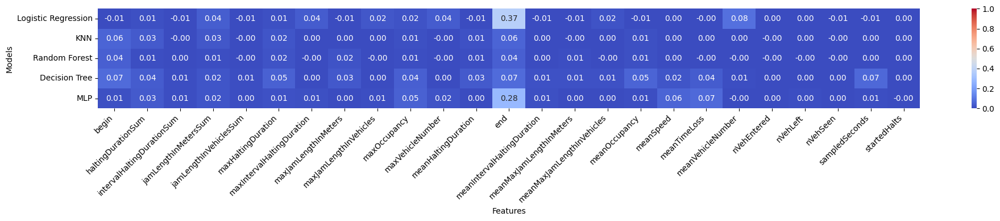

In [ ]:
df_accuracy_drops_bin = pd.DataFrame(fullFeatureaccuracy_drops, index=fullFeatureNames)
df_accuracy_drops_bin = df_accuracy_drops_bin.T  # Transpose to have models as rows and features as columns

# Plotting the heatmap
plt.figure(figsize=(20, 4))
sns.heatmap(df_accuracy_drops_bin, annot=True, cmap="coolwarm", fmt=".2f", vmin=0, vmax=1)
plt.ylabel('Models')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0, ha='right')

plt.tight_layout()
plt.show()

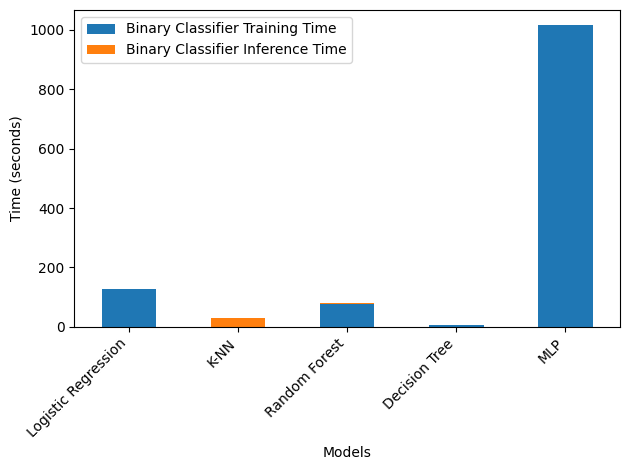

In [ ]:
time_comparison_df = pd.DataFrame({
    'Binary Classifier Training Time': [
        lgr_trainTime_bin.total_seconds(),
        knn_trainTime_bin.total_seconds(),
        rf_trainTime_bin.total_seconds(),
        dt_trainTime_bin.total_seconds(),
        mlp_trainTime_bin.total_seconds()],

    'Binary Classifier Inference Time': [
        lgr_inferTime_bin.total_seconds(),
        knn_inferTime_bin.total_seconds(),
        rf_inferTime_bin.total_seconds(),
        dt_inferTime_bin.total_seconds(),
        mlp_inferTime_bin.total_seconds()]
},
    index=['Logistic Regression', 'K-NN', 'Random Forest', 'Decision Tree', 'MLP']
)

# Create a stacked bar chart to compare training and inference time
time_comparison_df.plot(kind='bar', stacked=True)

# Labels for x & y axis
plt.xlabel('Models')
plt.ylabel('Time (seconds)')

# Rotate x-tick labels for better readability
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.tight_layout()
plt.show()


In [ ]:
!pip install lime

In [ ]:
models = {
    'Logistic Regression': logr_bin,  # Logistic Regression
    'KNN': knn_bin,  # K-Nearest Neighbors
    'Random Forest': rf_bin,  # Random Forest
    'Decision Tree': dt_bin,  # Decision Tree
    'MLP': mlp_bin  # Multi-Layer Perceptron
}


LIME explanation for Logistic Regression


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


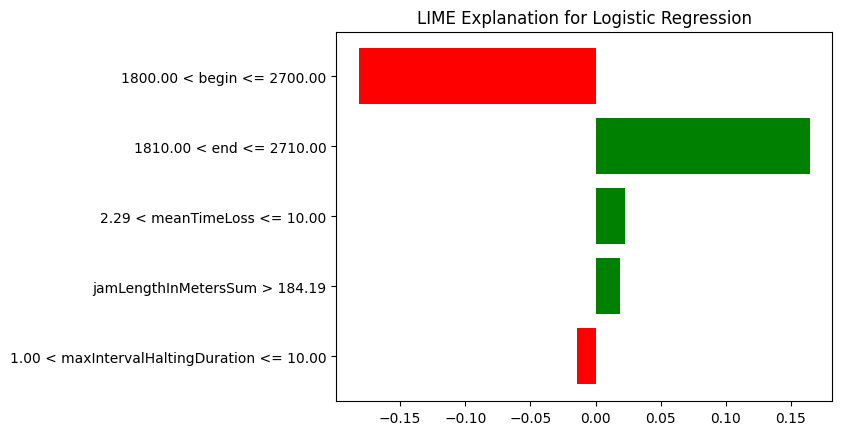

LIME explanation for KNN


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


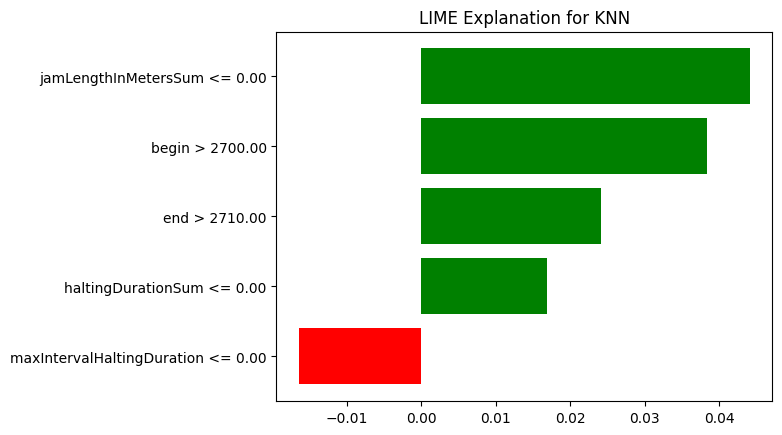

LIME explanation for Random Forest


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


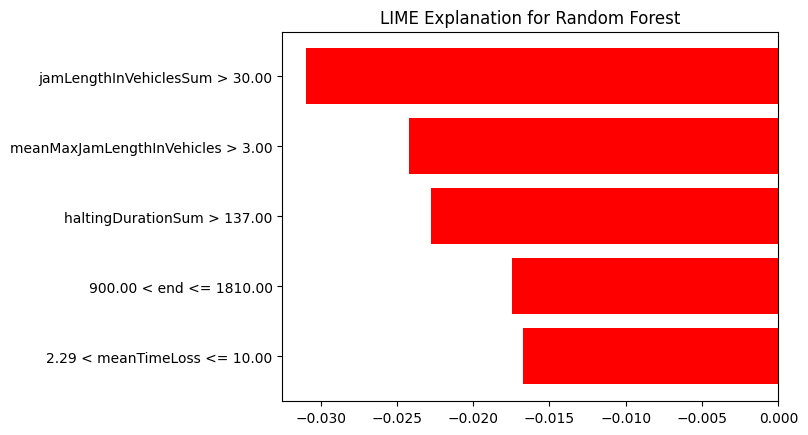

LIME explanation for Decision Tree


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


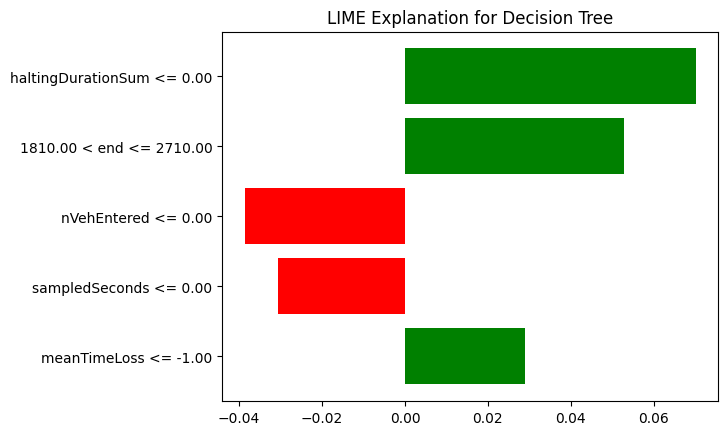

LIME explanation for MLP


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


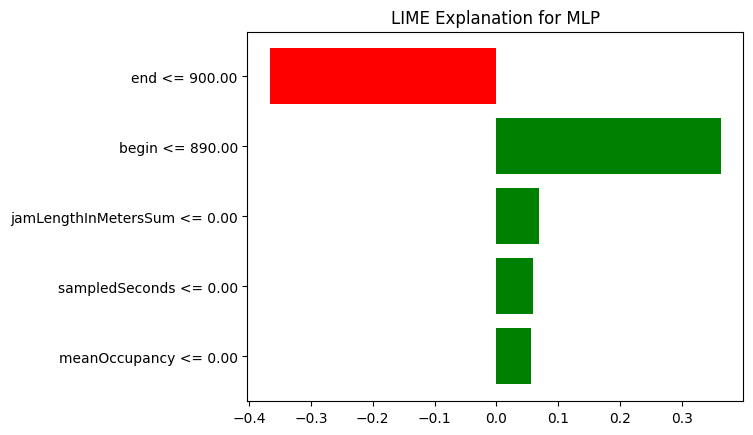

In [ ]:
import lime
import lime.lime_tabular
import numpy as np
import matplotlib.pyplot as plt

# LIME explainer for tabular data (applies to all models)
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train.values,
    feature_names=X_train.columns,
    class_names=['Class 0', 'Class 1'],
    mode='classification'
)

# LIME explanation for all models
for name, model in models.items():
    print(f"LIME explanation for {name}")

    # Choose an instance to explain (adjust 'i' to choose a specific instance)
    i = np.random.randint(0, X_test.shape[0])  # Random instance from X_test

    # Explain the selected instance
    exp = explainer.explain_instance(X_test.values[i], model.predict_proba, num_features=5)

    # Display LIME explanation
    exp.show_in_notebook(show_table=True, show_all=False)
    exp.as_pyplot_figure()
    plt.title(f"LIME Explanation for {name}")
    plt.show()
